# WAIs and Cyclones

### Import packages

In [12]:
%load_ext autoreload
%autoreload 2
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import numpy as np
import pandas as pd
import scipy
import datetime
import cartopy
import cartopy.feature as cfeature
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import glob
import subprocess
import dask
from joblib import Parallel, delayed
from geopy.distance import distance  
from cartopy.util import add_cyclic_point
import pyproj
from pyproj import Geod
from enum import Enum

import concurrent.futures

### Load MOAAP functions
import sys
sys.path.append('/work/aa0049/a271122/MOAAP/MOAAP/')
from src.utils import *
from src.Corrections import * 
from src.Enumerations import Month, Season, Experiments, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_contourf_rotated_grid #, plot_unstructured_rotated_grid

from src.GridPoints import Domain
import cmocean
import os
from moviepy.video.io.ImageSequenceClip import ImageSequenceClip

from ERA5_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
ERA5_clim_path='/work/aa0049/a271122/ERA5'

In [10]:
ds_zg = xr.open_mfdataset('/work/bm1159/XCES/data4xces/reanalysis/reanalysis/ECMWF/IFS/ERA5/1hr/atmos/zg/r1i1p1-085000Pa/zg_1hr_reanalysis_era5_r1i1p1-085000Pa_*.nc', chunks={"time":10})#,preprocess=preprocess)

In [19]:
ds_sic = xr.open_mfdataset("/work/bm1159/XCES/data4xces/reanalysis/reanalysis/ECMWF/IFS/ERA5/mon/seaIce/sic/r1i1p1/sic_OImon_reanalysis_era5_r1i1p1_*.nc")
ds_sic = ds_sic.sel(time=slice("1979-01-01", "2022-12-31"))
ds_sic_DJF = ds_sic.sel(time=ds_sic.sic.time.dt.month.isin([12,1,2])).mean(dim='time')

In [3]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/ERA5/Objects_transarctic_atlantic_ERA5.pkl', 'rb') as f:
   objs_final = pickle.load(f)

In [13]:
df_objs=define_df_objs(objs_final)

In [4]:
#Open moaap objects 
ds_moaap = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/ERA5_ICON_remapped_3x/ObjectMasks_MOAPP_ERA5_100and85controlperc_remapped_3x_*_corrected.nc',chunks={'time': 10})

# Extract 2D latitude and longitude values
lat_tmp = ds_moaap.rlat.isel(time=0,x=0, yc=0, xc=0).values  # 2D latitude array
lon_tmp = ds_moaap.rlon.isel(time=0,y=0, yc=0, xc=0).values  # 2D longitude array

# Drop original variables and assignlat/lon as coordinates
ds_moaap = ds_moaap.drop(['rlat', 'rlon']) \
                   .rename_dims({'y': 'rlat', 'x': 'rlon'}) \
                   .assign_coords(rlat=('rlat', lat_tmp), 
                                  rlon=('rlon', lon_tmp))

ds_moaap = ds_moaap.isel(yc=0, xc=0).squeeze()


In [5]:
ds_moaap_cyclones = xr.open_mfdataset('/work/aa0049/a271122/ERA5/ERA5_MOAAP_cyclones/*_ERA5_ObjectMasks__dt-1h_MOAAP-masks.nc')

# Plot Cyclones

In [17]:
def add_custom_colorbar(mappable, ax, ds, var_):

    standard_name = ds[var_].attrs.get('standard_name', var_)
    if var_=='pr':
        units = 'mm h-1'
    else:
        units = ds[var_].attrs.get('units', '')

    cbar = plt.colorbar(mappable, ax=ax, orientation='horizontal', pad=0.08, shrink = 0.8, extend='both')

       # force at least 5 ticks
    cbar.locator = MaxNLocator(nbins=5, min_n_ticks=5)
    cbar.update_ticks()
    
    cbar.set_label(f'{var_} ({units})', fontsize=15)
    cbar.ax.tick_params(labelsize=12)


In [6]:
def plot_WAIS_cyclones_zg(tt,dataset, var, ds_moaap,ds_moaap_cyclones, df_objs, objs, objs_plot_ids, crs_rot, mask_domains=None,savefig=False,show_figs=True):
    fig, ax = plt.subplots(1,1, figsize=(7, 7),
                            subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    

    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--', zorder=3)
    ax.coastlines(zorder=2)
    ax.add_feature(cartopy.feature.LAND, color='lightgray', alpha=1, zorder=0, edgecolor='black')

    #ax.add_feature(cartopy.feature.OCEAN, color='white', zorder=0, edgecolor='black')
    #fig.suptitle(f'Transarctic WAIs (IVT Objects) and large-scale features for ERA5 DJF | {pd.to_datetime(tt.values)}',fontweight='bold',y=0.97) #,ha='right' 
    
    # Clip to circle
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                                   np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    #Plot zg anomaly
    ds_zg = dataset
    ds_clim = xr.open_dataset(f'{ERA5_clim_path}/zg/clim/zg_clim_day_DJF.nc',chunks={'time': 10})

    #Compute anomaly
    tt_dt = pd.to_datetime(tt.values)
    month_day_str = f"{tt_dt.month:02d}-{tt_dt.day:02d}"
    
    
    var_tot = ds_zg[var].sel(time=tt, method='nearest')

    var_clim = ds_clim[var].sel(time=ds_clim.time.dt.strftime('%m-%d') == month_day_str)
    
    var_anom = var_tot - var_clim
    var_anom = var_anom.assign_coords(lon=((var_anom.lon + 180) % 360) - 180).sortby(['lat','lon'])
    
    var_anom_plot = var_anom.plot(ax=ax, cmap='RdBu_r', transform=ccrs.PlateCarree(),vmin=-120,vmax=120,add_colorbar=False)

    add_custom_colorbar(var_anom_plot, ax, ds_zg, 'zg')

    # Plot tracked objects
    ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
    obj_ids_tt = np.unique(ds_moaap_sel.IVT_Objects)
    obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)

    for obj_id in obj_ids_tt:
        if (df_objs['id'] == str(obj_id)).any():
            obj_color = df_objs[df_objs['id'] == str(obj_id)].color.item()
        else:
            obj_color = 'b'

        lw = 3 if str(obj_id) in objs_plot_ids else 1

        if str(obj_id) in objs_plot_ids:
            obj_idx = df_objs[df_objs['id'] == str(obj_id)].index.item()
            track = objs[obj_idx].track
            track_lats = np.array([x.lat for x in track.values])
            track_lons = np.array([x.lon for x in track.values])
            track_tt = track.sel(times=tt, method='nearest')
            ax.scatter(track_tt.item().lon, track_tt.item().lat, transform=crs_rot,
                       facecolor='#FB9A99', edgecolor='k', s=20)
            ax.plot(track_lons, track_lats, color='#FB9A99', lw=0.75, transform=crs_rot, zorder=8)
            ax.text(track_lons[-1], track_lats[-1], obj_id, transform=crs_rot, color='#FB9A99', zorder=11)

        (ds_moaap_sel.IVT_Objects == obj_id).plot.contour(x='rlon', y='rlat', ax=ax, levels=1,
                                                          colors='#FB9A99', linewidths=lw,
                                                          transform=crs_rot, zorder=10)

    #Add sea ice
    ds_sic_DJF.sic.plot.contour(levels=1, ax = ax, transform = ccrs.PlateCarree(), colors = 'cyan', linewidths = 1, linestyles = '-',zorder=1)

    #Add cyclones
    moaap_cyclones_sel = ds_moaap_cyclones.sel(time=tt,method='nearest')
    
    
    colors = [(0, 0, 0, 0), (0.5, 0.5, 0.5, 0.6)]  
    cmap = mcolors.ListedColormap(colors)
    bounds = [0, 50, 150]  # bins between 0 and 100
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    mesh = ax.pcolormesh(moaap_cyclones_sel.lon, moaap_cyclones_sel.lat, moaap_cyclones_sel.CY_Objects, transform=ccrs.PlateCarree(),
                         shading='auto', cmap=cmap, norm=norm)
    

    # Optional domain outlines
    if mask_domains:
        for domain_name, domain_data in mask_domains.items():
            domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                             linewidths=1.5, linestyles='--',
                                             zorder=4, ax=ax, transform=ccrs.PlateCarree())
    ax.set_title(f"Time: {pd.to_datetime(tt.values)}",y=1.05)  
    

    if savefig==True:
        path_input_images='ERA5/'
        path_movies='/work/aa0049/a271122/scripts/movies/cyclones/'
        plt.savefig(path_movies + f"{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300)#,transparent=True)
        #plt.close(fig)#
        
    if show_figs==True:
        plt.show()
    else:
        plt.clf()
        plt.close(fig)



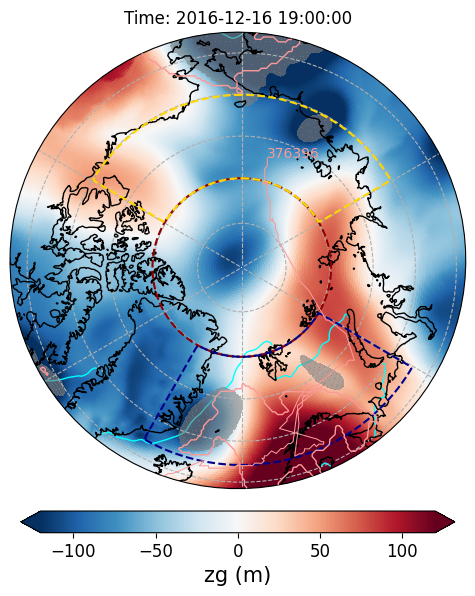

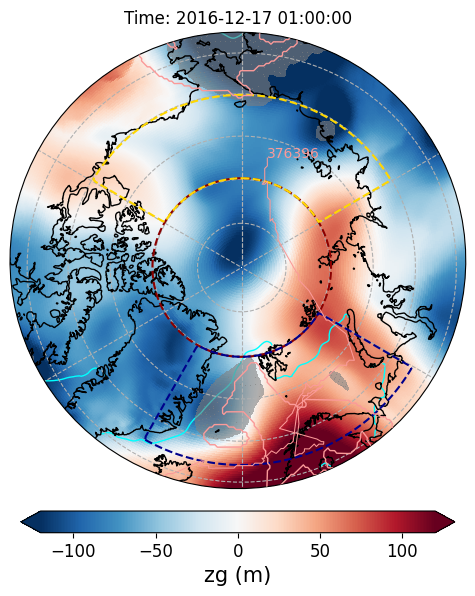

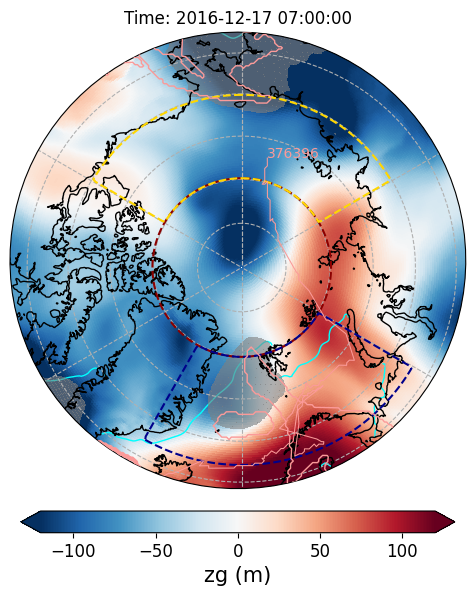

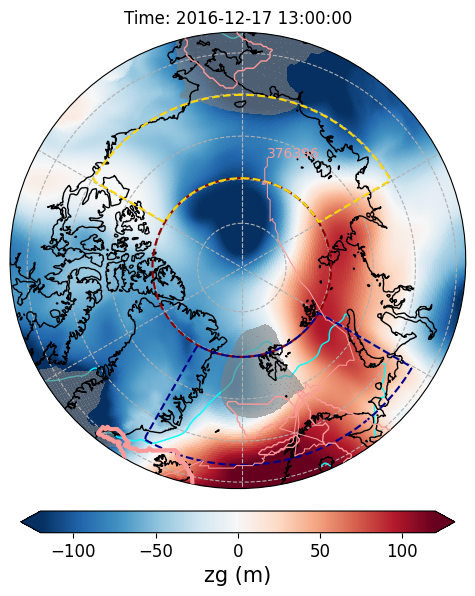

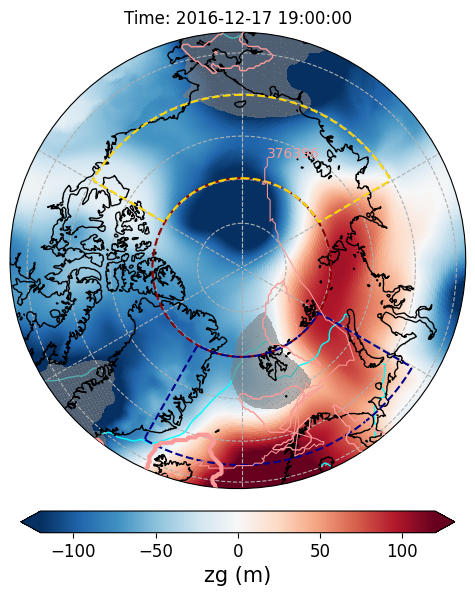

...

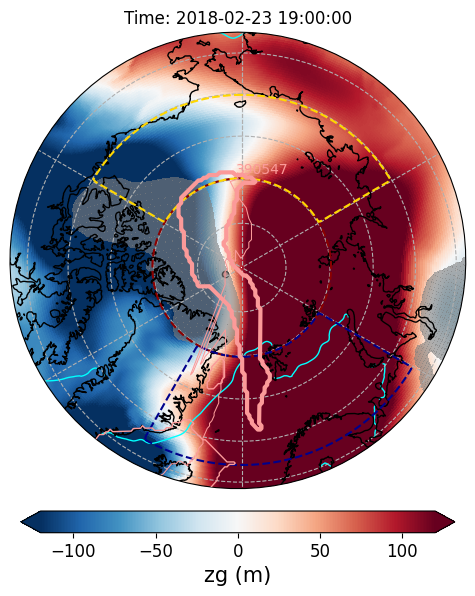

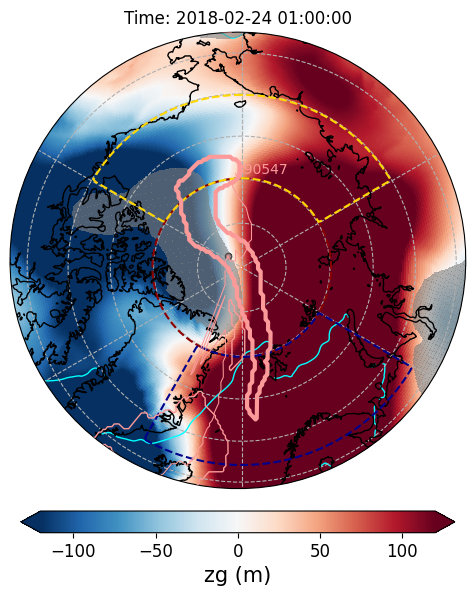

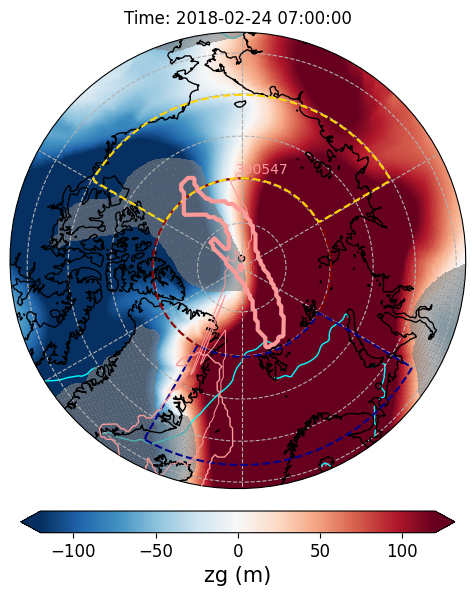

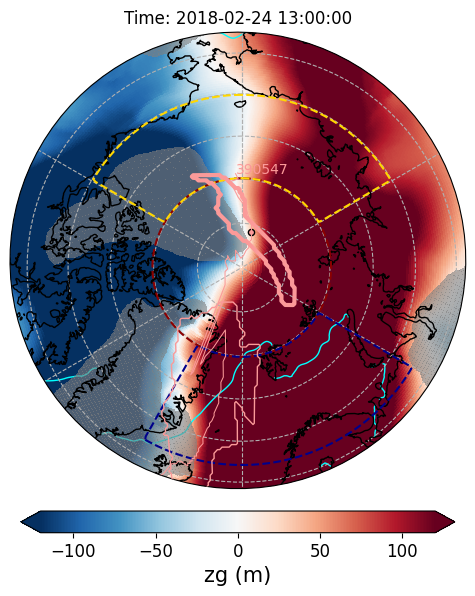

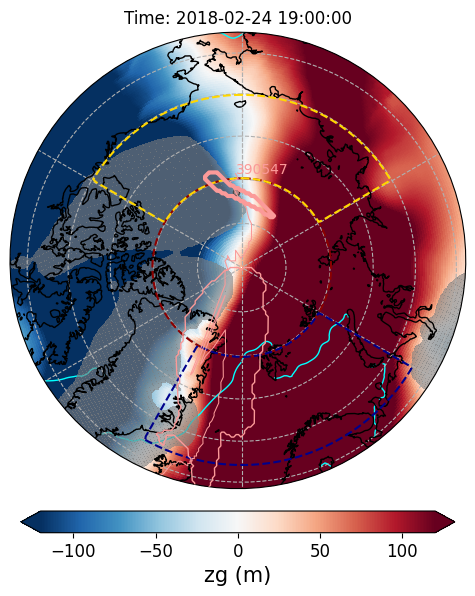

In [21]:
for i in range(11,13): 
    
    objs_plot_ids = [objs_final[i]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:    
        plot_WAIS_cyclones_zg(tt,ds_zg,'zg',ds_moaap,ds_moaap_cyclones,df_objs, objs_final, objs_plot_ids, crs_rot,mask_domains,savefig=False,show_figs=True)

In [ ]:
ds_moaap_cyclones

In [ ]:
ds_moaap_cyclones.CY_Objects[0].plot()

In [ ]:

# Extract 2D lat/lon and data slice
lat = ds_moaap_cyclones['lat'].values
lon = ds_moaap_cyclones['lon'].values
data = ds_moaap_cyclones['CY_Objects'].isel(time=0).values

# Define the projection (centered on 0°E)
proj = ccrs.NorthPolarStereo(central_longitude=0)

# Create plot
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})

# Plot data with geographic coordinates
mesh = ax.pcolormesh(lon, lat, data, transform=ccrs.PlateCarree(), shading='auto', cmap='viridis')

# Add map features
ax.coastlines()
ax.gridlines(draw_labels=True)
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())  # adjust if needed
ax.set_title('CY_Objects (Polar View)')

# Add colorbar
cbar = plt.colorbar(mesh, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('CY_Objects')

plt.tight_layout()
plt.show()


In [ ]:
### Make Animations from individual plots
#Requires all images to be in the path_input_images already
path_movies='/work/aa0049/a271122/scripts/movies/cyclones/'

# Set the path to images
image_folder = path_movies
video_name = 'movie_ERA5_cyclones_deepWAIS_DJF.mp4'

# Get sorted list of image paths
images = sorted([os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(".jpg")])

# Create video clip
clip = ImageSequenceClip(images, fps=3)
clip.write_videofile(image_folder+video_name, codec="libx264")



In [ ]:
(((ds_moaap_cyclones.lon + 180) % 360) - 180)



In [ ]:
# Extract lat, lon, and data slice
lat = ds_moaap_cyclones['lat'].values
lon = ds_moaap_cyclones.lon.values
lon = lon % 360

data = ds_moaap_cyclones['CY_Objects'].isel(time=57).values


In [ ]:
for i in range(0,100,5): 
    # Extract 2D lat/lon and data slice
    lat = ds_moaap_cyclones['lat'].values
    lon = ds_moaap_cyclones['lon'].values
    data = ds_moaap_cyclones['CY_Objects'].isel(time=i).values

    # Create a colormap: 0 = transparent, 100 = grey
    cmap = mcolors.ListedColormap(['none', '#7f7f7f'])
    bounds = [0, 50, 150]  # bins between 0 and 100
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # Create Orthographic projection centered at the North Pole
    proj = ccrs.Orthographic(central_longitude=0, central_latitude=90)

    fig, ax = plt.subplots(figsize=(5, 5), subplot_kw={'projection': proj})

    mesh = ax.pcolormesh(lon, lat, data, transform=ccrs.PlateCarree(),
                         shading='auto', cmap=cmap, norm=norm)
    ax.coastlines()
    ax.gridlines(draw_labels=True)
    ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())  # adjust if needed
    ax.set_title('CY_Objects (Polar View)')
    
    # Add colorbar
    cbar = plt.colorbar(mesh, orientation='vertical', shrink=0.7, pad=0.05)
    cbar.set_label('CY_Objects')
    
    plt.tight_layout()
    plt.show()


In [ ]:
for i in range(0,10,1):

    fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})
    
    ax.contour(ds_moaap_cyclones.CY_Objects[i].lon, ds_moaap_cyclones.CY_Objects[i].lat,ds_moaap_cyclones.CY_Objects[i],transform=ccrs.PlateCarree(), colors ='r', linewidths=2,levels=[1])
    
    cbar = ax.pcolormesh((ds_moaap_cyclones.SLP[i]/100).lon, (ds_moaap_cyclones.SLP[i]/100).lat,(ds_moaap_cyclones.SLP[i]/100),transform=ccrs.PlateCarree(),cmap='RdBu_r')#,vmin=980,vmax=1060)
    
    
    ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--',zorder=3)
    ax.coastlines(zorder=2)on = ds_moaap_cyclones['lon'].values
    ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
    
    
    # Add the colorbar
    cbar = fig.colorbar(cbar, ax=ax, orientation='vertical', pad=0.08, aspect=20)
    cbar.set_label('Sea Level Pressure [hPa]')

    
    plt.show()